In [2]:
# conda base 

# Data manipulation 
import pandas as pd 
import numpy as np
import os

# Data viz
import matplotlib.pyplot as plt 
import seaborn as sns
import plotly.express as px

In [3]:
# load seqs annots
df_annot = pd.read_csv("../results/tables/df_annot_all.csv", sep = "\t")

# load likelihoods from carp and merge dset
df_plm = pd.read_pickle("../results/embeddings/all_plm.pkl")
df_plm = df_plm[["seq_id", "carp640M_logp"]]
df_annot_plm = pd.merge(df_annot, df_plm, on = "seq_id")

# load tsne coords and merge annots
df_sbl = pd.read_csv("../results/dim_redo/splitted_classes/tsne/tsne_2d_plm_sbl_esm1b.csv")
df_sbl = df_sbl.merge(df_annot_plm, on = "seq_id")
df_mbl = pd.read_csv("../results/dim_redo/splitted_classes/tsne/tsne_2d_plm_mbl_esm1b.csv")
df_mbl = df_mbl.merge(df_annot_plm, on = "seq_id")


# remove taxx annots
all_dfs = [df_sbl, df_mbl]
for df in all_dfs:
    df["Domain"] = df.Domain.str.replace("d__", "")
    df["Phylum"] = df.Phylum.str.replace("p__", "")
    df["Class"] = df.Class.str.replace("c__", "")
    df["Order"] = df.Order.str.replace("o__", "")
    df["Family"] = df.Family.str.replace("f__", "")
    df["Genus"] = df.Genus.str.replace("g__", "")
    df["Species"] = df.Species.str.replace("s__", "")

In [4]:
def do_iscatter(df, annot):
    
    """
    do a scatterplot given a df and hue
    """
   
    # plot
    fig = px.scatter(
    df, x = 'tSNE1_esm1b', y = 'tSNE2_esm1b',
    height = 600, width = 700, color = annot,
    hover_name = "protein_name", 
    color_discrete_sequence = px.colors.qualitative.Plotly,
    hover_data = ["protein_family_header", '#name'])

    fig.update_traces(marker=dict(size=8, line=dict(width=1,color='black')),selector=dict(mode='markers'))
    fig.update_layout(template="plotly_white")
    #fig.update_xaxes(showgrid=True, gridwidth=0.5, gridcolor='LightGrey',mirror=True)
    #fig.update_yaxes(showgrid=True, gridwidth=0.5, gridcolor='LightGrey', mirror=True)
    fig.update_yaxes(showline=True, linewidth=1, linecolor='LightGrey')
    fig.update_xaxes(showline=True, linewidth=1, linecolor='LightGrey')
    fig.show()

In [5]:
# export consensus 
# df_annot[df_annot.bla_class.str.contains("Consensus")][["protein_name", "seq"]].to_csv("cons.csv", index = False)

In [6]:
# my code 
# df = df_sbl.copy()
# 
# taxas = ['Phylum', 'Class', 'Order', 'Family', 'Genus', 'Species']
# 
# for taxa in taxa_lst:
#     top9 = list(df[taxa].value_counts()[:9].index)
#     df.loc[~df[taxa].isin(top9), taxa] = "Other"
# 
# 
# plt.figure(figsize=(20,9)) # 25,10
# 
# for idx, taxa in enumerate(taxas):
# 
#     
#     ax = plt.subplot(2, 3, idx+1)
#     sns.scatterplot(
#         data = df.sort_values(by=taxa, key=lambda x: x.map(x.value_counts()), ascending=False), 
#         x="tSNE1_esm1b", y="tSNE2_esm1b", hue=taxa, alpha=0.1, edgecolor = None, palette="tab10", ax = ax)
#     plt.title(taxa)
#     
#     h, l = ax.get_legend_handles_labels()
#     counts = df[taxa].value_counts().reindex(l)
#     l = [f'{yn} ({c})' for yn,c in counts.iteritems()]
#     ax.legend(h,l, title="Top 10 taxa", loc='center left', bbox_to_anchor=(1, 0.5))
#     plt.tight_layout()
#     
# plt.suptitle("Taxonomy")
# plt.tight_layout()

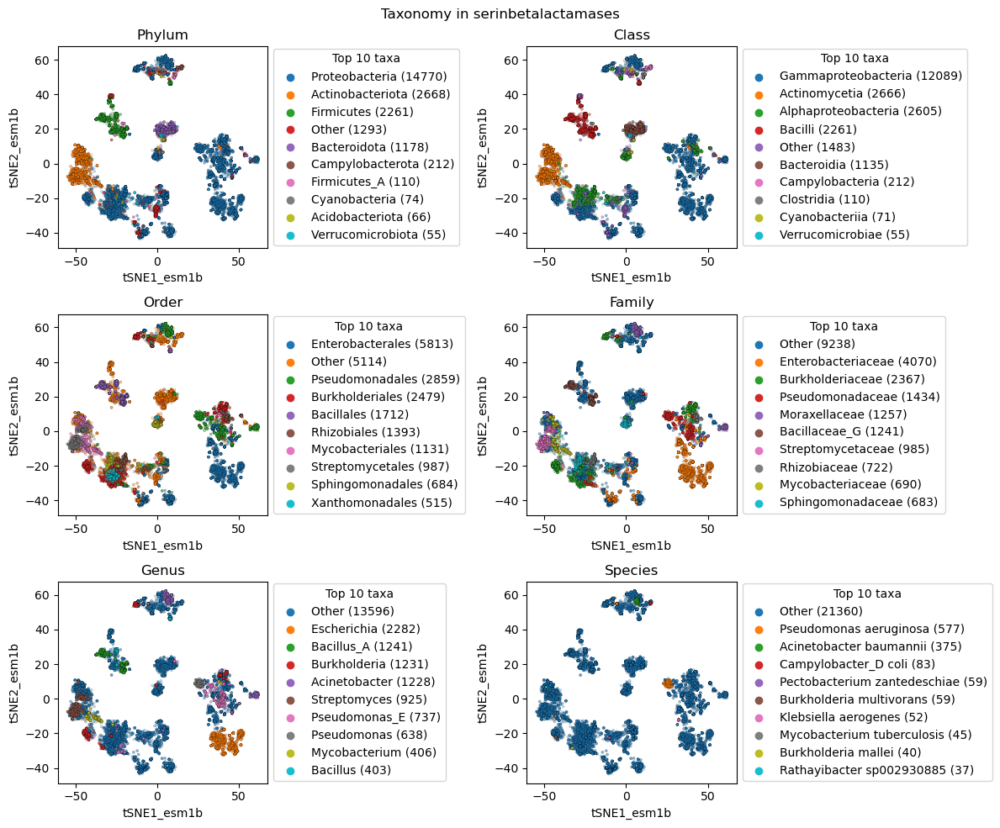

In [7]:
# data source
df = df_sbl.copy()

# taxonomic levels to plot
taxa_lst = ['Phylum', 'Class', 'Order', 'Family', 'Genus', 'Species']

# take the top10 mos abundant taxonomic levels
for taxa in taxa_lst:
    top9 = list(df[taxa].value_counts()[:9].index)
    df.loc[~df[taxa].isin(top9), taxa] = "Other"

# create a custom palette based on tab10, but with greys as first colors
# c = plt.cm.tab10.colors
# c = c[1:] + c[:1]
    
    # set the composition of the figure 
plt.figure(figsize=(12,10))

# per each taxonomic level 
for idx, taxa in enumerate(taxa_lst):
    
    # create a subplot for the current taxonomic level
    ax = plt.subplot(3, 2, idx+1)
    
    # sort the df by abundance of the current taxonomic level
    df_sorted = df.sort_values(by=taxa, key=lambda x: x.map(x.value_counts()), ascending=False)
    
    # scatterplot
    sns.scatterplot(
        data = df_sorted, x="tSNE1_esm1b", y="tSNE2_esm1b", hue=taxa, 
        alpha=0.3, edgecolor = "black", palette="tab10", ax = ax, s=5)
    
    # set the title
    plt.title(taxa)
    
    # get the legend
    h, l = ax.get_legend_handles_labels()
    
    # get the counts for each taxon and order the labels to match the order of the handles
    counts = df[taxa].value_counts().reindex(l)
    
    # create new labels that include the count for each taxon
    l = [f'{yn} ({c})' for yn,c in counts.iteritems()]
    
    # set the legend with the new labels and title
    ax.legend(h,l, title="Top 10 taxa", loc='center left', bbox_to_anchor=(1, 0.5))
    
    # adjust
    plt.tight_layout()

# set the main title
plt.suptitle("Taxonomy in serinbetalactamases")
plt.tight_layout()
plt.show()

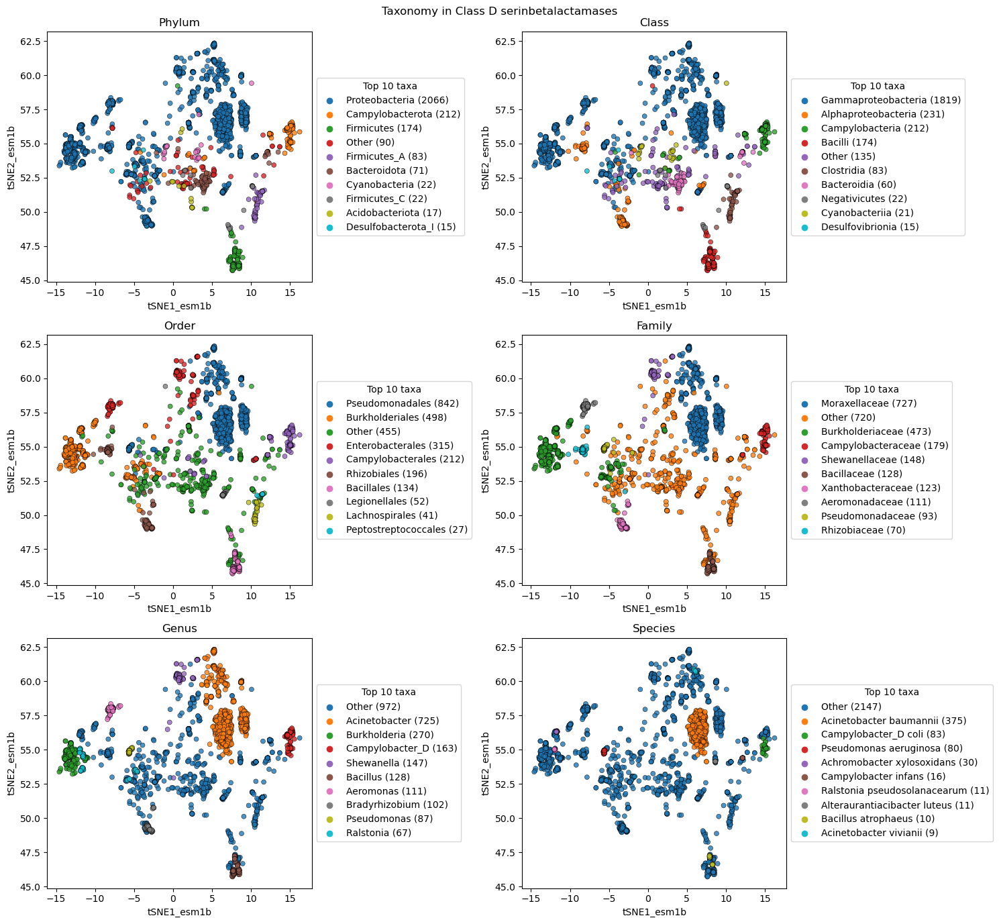

In [8]:
# data source
df = df_sbl[df_sbl.bla_class == "Class D"].copy()
df = df[df.tSNE1_esm1b.between(-25,25)]

# taxonomic levels to plot
taxa_lst = ['Phylum', 'Class', 'Order', 'Family', 'Genus', 'Species']

# take the top10 mos abundant taxonomic levels
for taxa in taxa_lst:
    top9 = list(df[taxa].value_counts()[:9].index)
    df.loc[~df[taxa].isin(top9), taxa] = "Other"

# create a custom palette based on tab10, but with greys as first colors
# c = plt.cm.tab10.colors
# c = c[1:] + c[:1]
    
    # set the composition of the figure 
plt.figure(figsize=(15,14))

# per each taxonomic level 
for idx, taxa in enumerate(taxa_lst):
    
    # create a subplot for the current taxonomic level
    ax = plt.subplot(3, 2, idx+1)
    
    # sort the df by abundance of the current taxonomic level
    df_sorted = df.sort_values(by=taxa, key=lambda x: x.map(x.value_counts()), ascending=False)
    
    # scatterplot
    sns.scatterplot(
        data = df_sorted, x="tSNE1_esm1b", y="tSNE2_esm1b", hue=taxa, 
        alpha=0.8, edgecolor = "black", palette="tab10", ax = ax, s=25)
    
    # set the title
    plt.title(taxa)
    
    # get the legend
    h, l = ax.get_legend_handles_labels()
    
    # get the counts for each taxon and order the labels to match the order of the handles
    counts = df[taxa].value_counts().reindex(l)
    
    # create new labels that include the count for each taxon
    l = [f'{yn} ({c})' for yn,c in counts.iteritems()]
    
    # set the legend with the new labels and title
    ax.legend(h,l, title="Top 10 taxa", loc='center left', bbox_to_anchor=(1, 0.5))
    
    # adjust
    plt.tight_layout()

# set the main title
plt.suptitle("Taxonomy in Class D serinbetalactamases")
plt.tight_layout()
plt.show()

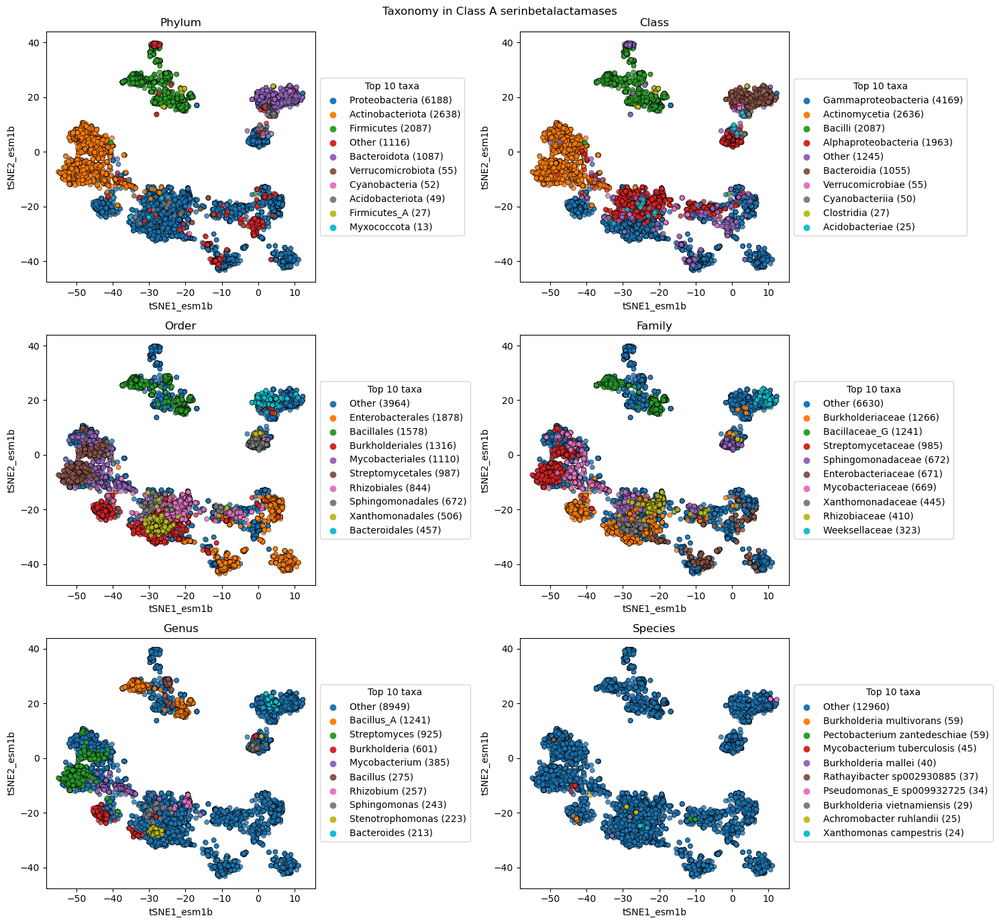

In [9]:
# data source
df = df_sbl[df_sbl.bla_class == "Class A"].copy()
df = df[df.tSNE1_esm1b.between(-60,20)]

# taxonomic levels to plot
taxa_lst = ['Phylum', 'Class', 'Order', 'Family', 'Genus', 'Species']

# take the top10 mos abundant taxonomic levels
for taxa in taxa_lst:
    top9 = list(df[taxa].value_counts()[:9].index)
    df.loc[~df[taxa].isin(top9), taxa] = "Other"

# create a custom palette based on tab10, but with greys as first colors
# c = plt.cm.tab10.colors
# c = c[1:] + c[:1]
    
    # set the composition of the figure 
plt.figure(figsize=(15,14))

# per each taxonomic level 
for idx, taxa in enumerate(taxa_lst):
    
    # create a subplot for the current taxonomic level
    ax = plt.subplot(3, 2, idx+1)
    
    # sort the df by abundance of the current taxonomic level
    df_sorted = df.sort_values(by=taxa, key=lambda x: x.map(x.value_counts()), ascending=False)
    
    # scatterplot
    sns.scatterplot(
        data = df_sorted, x="tSNE1_esm1b", y="tSNE2_esm1b", hue=taxa, 
        alpha=0.8, edgecolor = "black", palette="tab10", ax = ax, s=25)
    
    # set the title
    plt.title(taxa)
    
    # get the legend
    h, l = ax.get_legend_handles_labels()
    
    # get the counts for each taxon and order the labels to match the order of the handles
    counts = df[taxa].value_counts().reindex(l)
    
    # create new labels that include the count for each taxon
    l = [f'{yn} ({c})' for yn,c in counts.iteritems()]
    
    # set the legend with the new labels and title
    ax.legend(h,l, title="Top 10 taxa", loc='center left', bbox_to_anchor=(1, 0.5))
    
    # adjust
    plt.tight_layout()

# set the main title
plt.suptitle("Taxonomy in Class A serinbetalactamases")
plt.tight_layout()
plt.show()

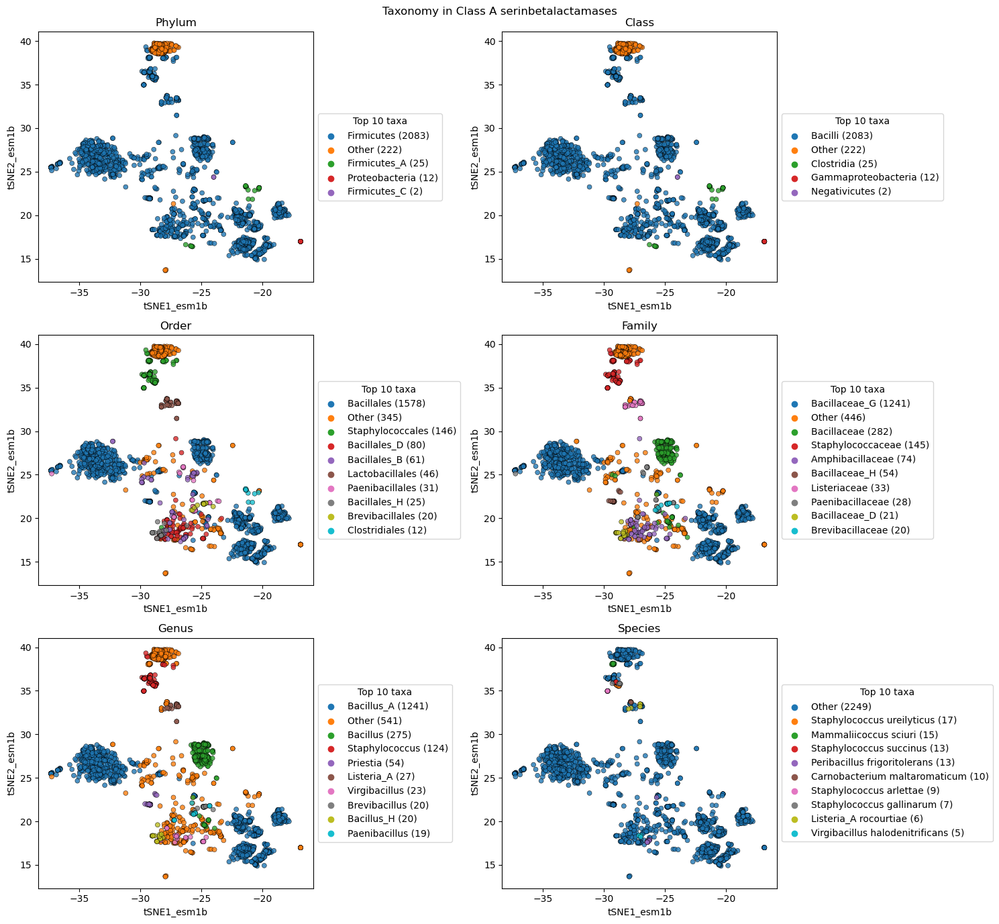

In [10]:
# data source
df = df_sbl[df_sbl.bla_class == "Class A"].copy()
df = df[(df.tSNE1_esm1b.between(-40,-15)) & (df.tSNE2_esm1b.between(5,50))]

# taxonomic levels to plot
taxa_lst = ['Phylum', 'Class', 'Order', 'Family', 'Genus', 'Species']

# take the top10 mos abundant taxonomic levels
for taxa in taxa_lst:
    top9 = list(df[taxa].value_counts()[:9].index)
    df.loc[~df[taxa].isin(top9), taxa] = "Other"

# create a custom palette based on tab10, but with greys as first colors
# c = plt.cm.tab10.colors
# c = c[1:] + c[:1]
    
    # set the composition of the figure 
plt.figure(figsize=(15,14))

# per each taxonomic level 
for idx, taxa in enumerate(taxa_lst):
    
    # create a subplot for the current taxonomic level
    ax = plt.subplot(3, 2, idx+1)
    
    # sort the df by abundance of the current taxonomic level
    df_sorted = df.sort_values(by=taxa, key=lambda x: x.map(x.value_counts()), ascending=False)
    
    # scatterplot
    sns.scatterplot(
        data = df_sorted, x="tSNE1_esm1b", y="tSNE2_esm1b", hue=taxa, 
        alpha=0.8, edgecolor = "black", palette="tab10", ax = ax, s=25)
    
    # set the title
    plt.title(taxa)
    
    # get the legend
    h, l = ax.get_legend_handles_labels()
    
    # get the counts for each taxon and order the labels to match the order of the handles
    counts = df[taxa].value_counts().reindex(l)
    
    # create new labels that include the count for each taxon
    l = [f'{yn} ({c})' for yn,c in counts.iteritems()]
    
    # set the legend with the new labels and title
    ax.legend(h,l, title="Top 10 taxa", loc='center left', bbox_to_anchor=(1, 0.5))
    
    # adjust
    plt.tight_layout()

# set the main title
plt.suptitle("Taxonomy in Class A serinbetalactamases")
plt.tight_layout()
plt.show()

In [11]:
do_iscatter(df, "Class")

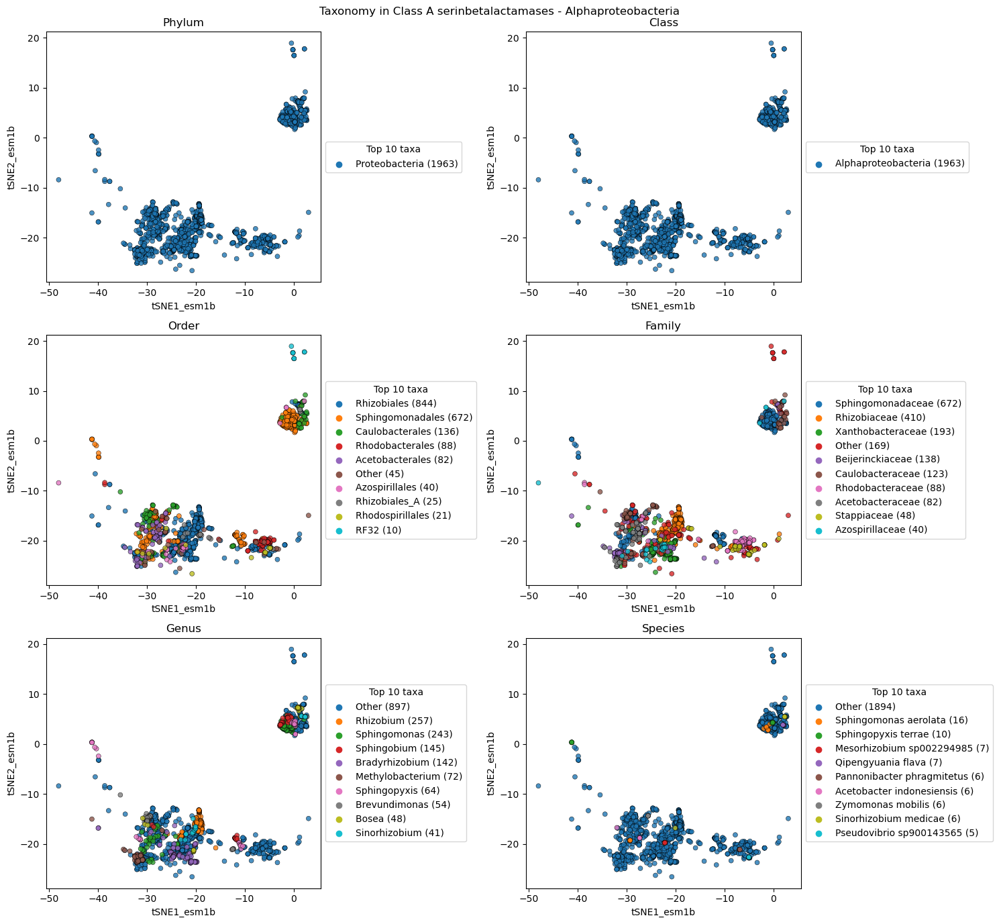

In [12]:
# data source
df = df_sbl[df_sbl.bla_class == "Class A"].copy()
df = df[df.tSNE1_esm1b.between(-60,20)]
df = df[df.Class == "Alphaproteobacteria"]


# taxonomic levels to plot
taxa_lst = ['Phylum', 'Class', 'Order', 'Family', 'Genus', 'Species']

# take the top10 mos abundant taxonomic levels
for taxa in taxa_lst:
    top9 = list(df[taxa].value_counts()[:9].index)
    df.loc[~df[taxa].isin(top9), taxa] = "Other"

# create a custom palette based on tab10, but with greys as first colors
# c = plt.cm.tab10.colors
# c = c[1:] + c[:1]
    
    # set the composition of the figure 
plt.figure(figsize=(15,14))

# per each taxonomic level 
for idx, taxa in enumerate(taxa_lst):
    
    # create a subplot for the current taxonomic level
    ax = plt.subplot(3, 2, idx+1)
    
    # sort the df by abundance of the current taxonomic level
    df_sorted = df.sort_values(by=taxa, key=lambda x: x.map(x.value_counts()), ascending=False)
    
    # scatterplot
    sns.scatterplot(
        data = df_sorted, x="tSNE1_esm1b", y="tSNE2_esm1b", hue=taxa, 
        alpha=0.8, edgecolor = "black", palette="tab10", ax = ax, s=25)
    
    # set the title
    plt.title(taxa)
    
    # get the legend
    h, l = ax.get_legend_handles_labels()
    
    # get the counts for each taxon and order the labels to match the order of the handles
    counts = df[taxa].value_counts().reindex(l)
    
    # create new labels that include the count for each taxon
    l = [f'{yn} ({c})' for yn,c in counts.iteritems()]
    
    # set the legend with the new labels and title
    ax.legend(h,l, title="Top 10 taxa", loc='center left', bbox_to_anchor=(1, 0.5))
    
    # adjust
    plt.tight_layout()

# set the main title
plt.suptitle("Taxonomy in Class A serinbetalactamases - Alphaproteobacteria")
plt.tight_layout()
plt.show()

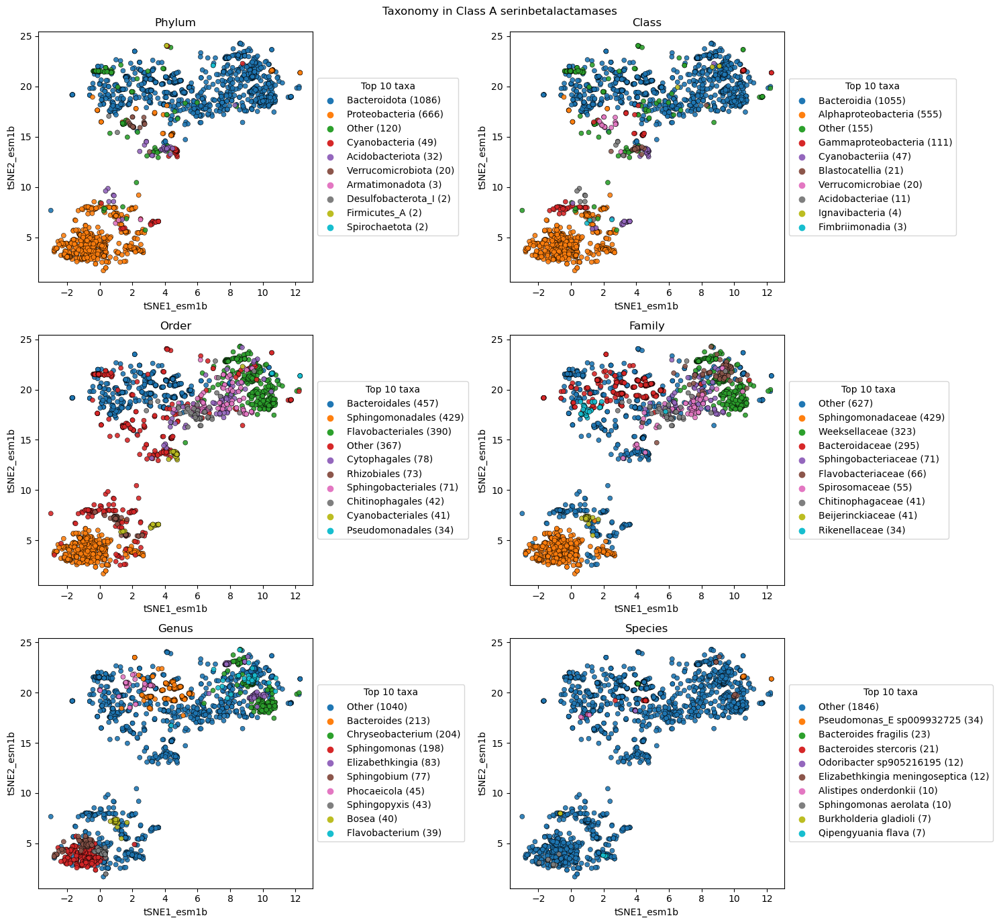

In [13]:
# data source
df = df_sbl[df_sbl.bla_class == "Class A"].copy()
df = df[(df.tSNE1_esm1b.between(-10,15)) & (df.tSNE2_esm1b.between(0,30))]

# taxonomic levels to plot
taxa_lst = ['Phylum', 'Class', 'Order', 'Family', 'Genus', 'Species']

# take the top10 mos abundant taxonomic levels
for taxa in taxa_lst:
    top9 = list(df[taxa].value_counts()[:9].index)
    df.loc[~df[taxa].isin(top9), taxa] = "Other"

# create a custom palette based on tab10, but with greys as first colors
# c = plt.cm.tab10.colors
# c = c[1:] + c[:1]
    
    # set the composition of the figure 
plt.figure(figsize=(15,14))

# per each taxonomic level 
for idx, taxa in enumerate(taxa_lst):
    
    # create a subplot for the current taxonomic level
    ax = plt.subplot(3, 2, idx+1)
    
    # sort the df by abundance of the current taxonomic level
    df_sorted = df.sort_values(by=taxa, key=lambda x: x.map(x.value_counts()), ascending=False)
    
    # scatterplot
    sns.scatterplot(
        data = df_sorted, x="tSNE1_esm1b", y="tSNE2_esm1b", hue=taxa, 
        alpha=0.9, edgecolor = "black", palette="tab10", ax = ax, s=25)
    
    # set the title
    plt.title(taxa)
    
    # get the legend
    h, l = ax.get_legend_handles_labels()
    
    # get the counts for each taxon and order the labels to match the order of the handles
    counts = df[taxa].value_counts().reindex(l)
    
    # create new labels that include the count for each taxon
    l = [f'{yn} ({c})' for yn,c in counts.iteritems()]
    
    # set the legend with the new labels and title
    ax.legend(h,l, title="Top 10 taxa", loc='center left', bbox_to_anchor=(1, 0.5))
    
    # adjust
    plt.tight_layout()

# set the main title
plt.suptitle("Taxonomy in Class A serinbetalactamases")
plt.tight_layout()
plt.show()

In [14]:
df_a2_proteo = df[df.tSNE2_esm1b.between(1,11)]

# take representative
df_a2_proteo90 = df_a2_proteo[df_a2_proteo.is_clust90_rep == "Yes"]

# to do a msa 
# df_a2_proteo90[["protein_name", "seq"]].to_csv(
#     "/home/gama/desktop/subclass_A_Clust90/a2_proteobacteria/a2_proteobacteria_clust90.csv", 
#     index = False, sep  = "\t", header = False)

In [15]:
# sample all phlyms and 73 potins from proteobcateria
df_a2_proteo90_minus = df_a2_proteo90[~df_a2_proteo90.Phylum.str.contains("Proteobacteria")]
df_a2_proteo90_mayor = df_a2_proteo90[df_a2_proteo90.Phylum.str.contains("Proteobacteria")].sample(73)

# concat data 
df_a2_proteo90_concat = pd.concat([df_a2_proteo90_minus, df_a2_proteo90_mayor])

# export data 
# df_a2_proteo90_concat[["protein_name", "seq"]].to_csv("/home/gama/desktop/subclass_A_Clust90/a2_proteobacteria/a2_proteobacteria_rand100.csv", index = False)

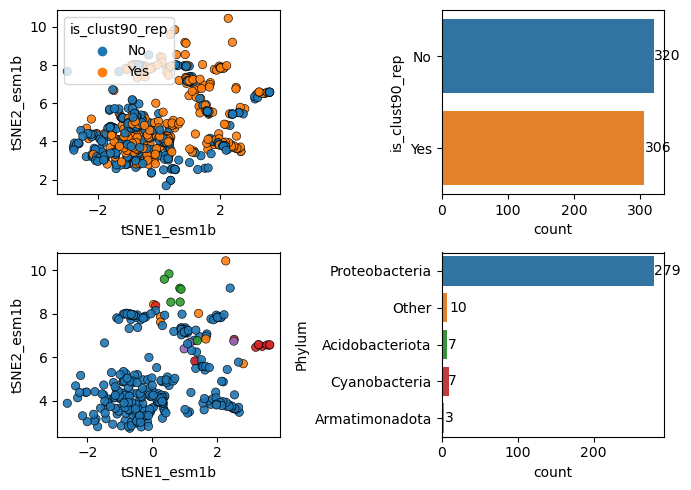

In [16]:
fig, axs = plt.subplots(2, 2, figsize=(7, 5))

sns.scatterplot(
        data = df_a2_proteo, x="tSNE1_esm1b", y="tSNE2_esm1b", hue="is_clust90_rep", 
        alpha=0.9, edgecolor = "black", palette="tab10", ax=axs[0,0])

sns.countplot(data = df_a2_proteo, y="is_clust90_rep", ax=axs[0,1])
counts = df_a2_proteo['is_clust90_rep'].value_counts()
for i, count in enumerate(counts):
    axs[0,1].annotate(count, xy=(count+1, i), va='center')
    
sns.scatterplot(
        data = df_a2_proteo[df_a2_proteo.is_clust90_rep == "Yes"], x="tSNE1_esm1b", y="tSNE2_esm1b", hue="Phylum", 
        alpha=0.9, edgecolor = "black", palette="tab10", ax=axs[1,0], legend = False)

sns.countplot(data = df_a2_proteo[df_a2_proteo.is_clust90_rep == "Yes"], y="Phylum", ax=axs[1,1])
counts = df_a2_proteo[df_a2_proteo.is_clust90_rep == "Yes"]['Phylum'].value_counts()
for i, count in enumerate(counts):
    axs[1,1].annotate(count, xy=(count+1, i), va='center')

fig.tight_layout()

In [17]:
df_a2_proteo90_concat[df_a2_proteo90_concat.protein_name == "SPH-1"]

,tSNE1_esm1b,tSNE2_esm1b,seq_id,#name,seq,length,filename,protein_name,protein_family,bla_class,...,predicted_signal_peptide,Other_sigpept,SP(Sec/SPI),LIPO(Sec/SPII),TAT(Tat/SPI),TATLIPO(Sec/SPII),PILIN(Sec/SPIII),CS Position,seq_without_sigpept,carp640M_logp
12552,2.255515,10.442667,seq_12549,ACZ39462.1|SPH-1| serine hydrolase,MDGMTIDWSGVAAAVAAAEATGGTVGATIVAPGGETFRHNGDRRFR...,272,A-SPH-1-prot.fasta,SPH-1,SPH,Class A,...,NO_SP,1.000009,0.0,0.0,0.0,0.0,0.0,NaN,MDGMTIDWSGVAAAVAAAEATGGTVGATIVAPGGETFRHNGDRRFR...,-0.251955


In [18]:
# directory = '/home/gama/desktop/a2_proteobacteria_rand100/'
# 
# # Lista de archivos en el directorio
# file_list = os.listdir(directory)
# file_list = [file[4:-4] for file in file_list]

In [19]:
#xd = df_a2_proteo90[df_a2_proteo90.protein_name.isin(file_list)]
#xd[["protein_name", "seq_without_sigpept"]].to_csv("/home/gama/desktop/subclass_A_Clust90/a2_proteobacteria/a2_proteobacteria_rand100_wo_signal_peptide.csv", index = False)

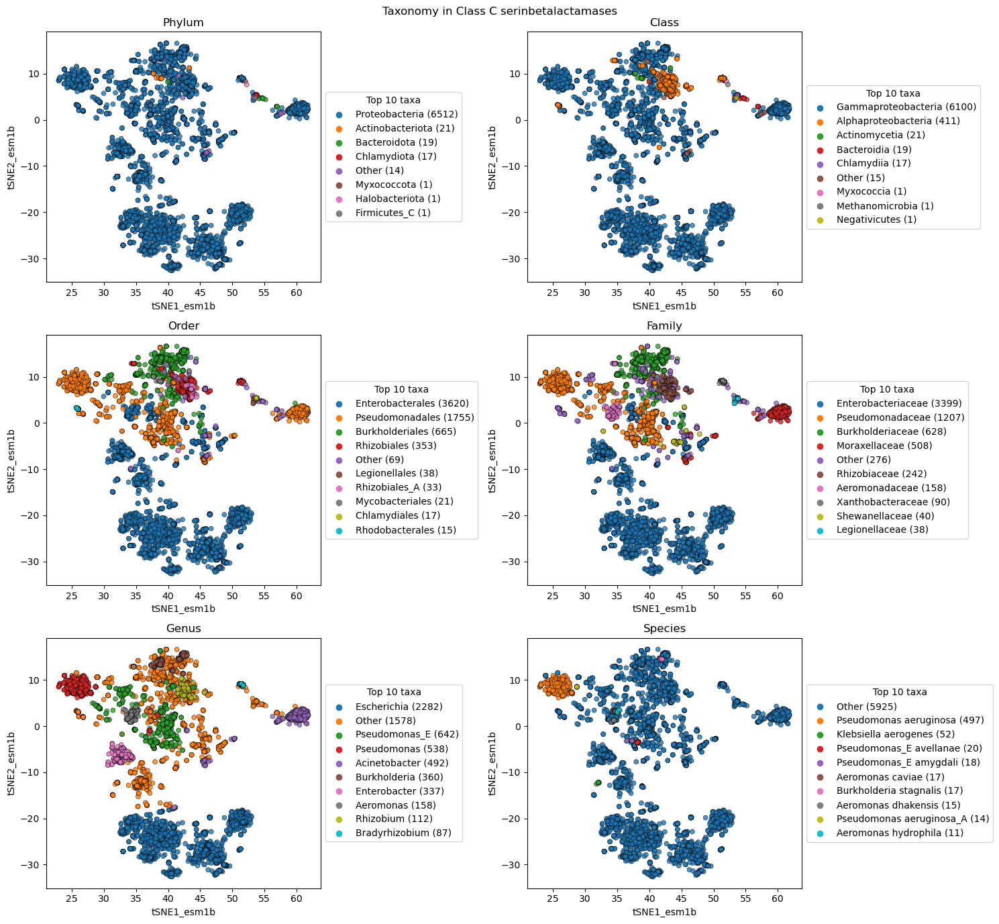

In [20]:
# data source
df = df_sbl[df_sbl.bla_class == "Class C"].copy()

# taxonomic levels to plot
taxa_lst = ['Phylum', 'Class', 'Order', 'Family', 'Genus', 'Species']

# take the top10 mos abundant taxonomic levels
for taxa in taxa_lst:
    top9 = list(df[taxa].value_counts()[:9].index)
    df.loc[~df[taxa].isin(top9), taxa] = "Other"

# create a custom palette based on tab10, but with greys as first colors
# c = plt.cm.tab10.colors
# c = c[1:] + c[:1]
    
    # set the composition of the figure 
plt.figure(figsize=(15,14))

# per each taxonomic level 
for idx, taxa in enumerate(taxa_lst):
    
    # create a subplot for the current taxonomic level
    ax = plt.subplot(3, 2, idx+1)
    
    # sort the df by abundance of the current taxonomic level
    df_sorted = df.sort_values(by=taxa, key=lambda x: x.map(x.value_counts()), ascending=False)
    
    # scatterplot
    sns.scatterplot(
        data = df_sorted, x="tSNE1_esm1b", y="tSNE2_esm1b", hue=taxa, 
        alpha=0.8, edgecolor = "black", palette="tab10", ax = ax, s=25)
    
    # set the title
    plt.title(taxa)
    
    # get the legend
    h, l = ax.get_legend_handles_labels()
    
    # get the counts for each taxon and order the labels to match the order of the handles
    counts = df[taxa].value_counts().reindex(l)
    
    # create new labels that include the count for each taxon
    l = [f'{yn} ({c})' for yn,c in counts.iteritems()]
    
    # set the legend with the new labels and title
    ax.legend(h,l, title="Top 10 taxa", loc='center left', bbox_to_anchor=(1, 0.5))
    
    # adjust
    plt.tight_layout()

# set the main title
plt.suptitle("Taxonomy in Class C serinbetalactamases")
plt.tight_layout()
plt.show()

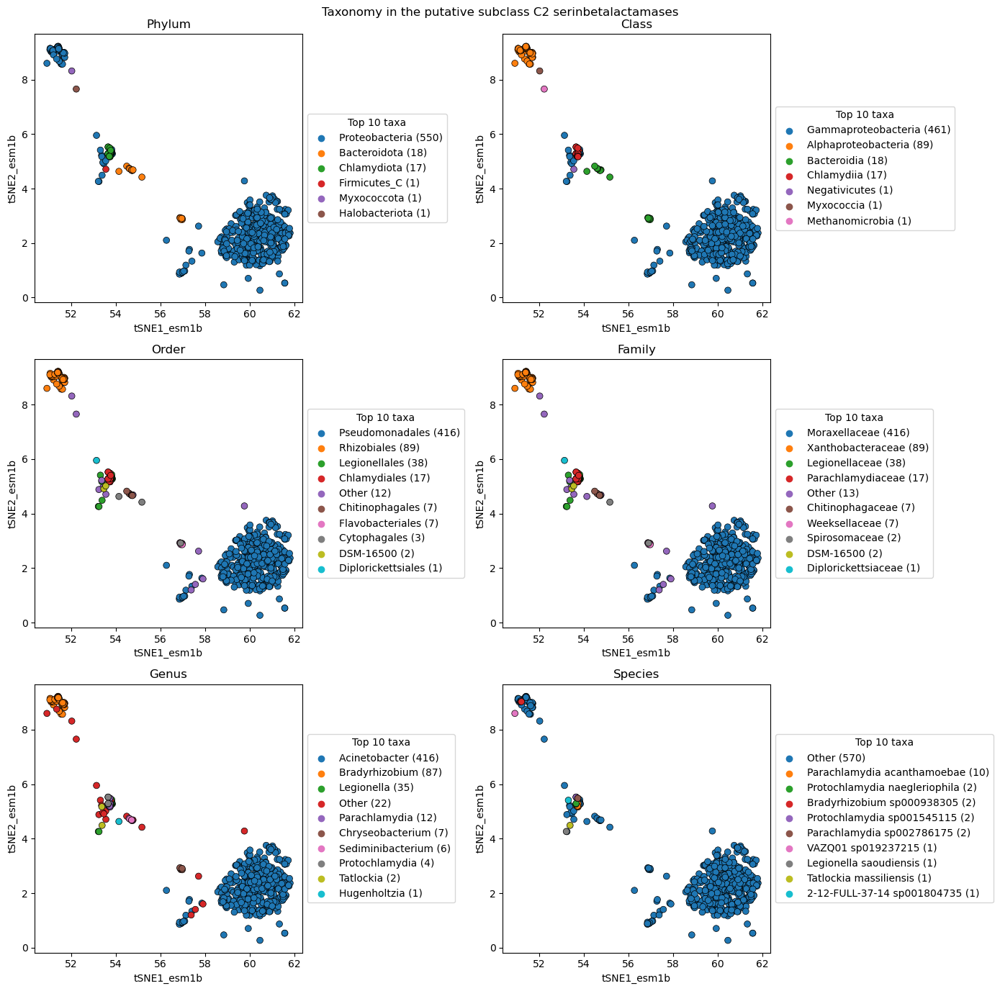

In [21]:
# data source
df = df_sbl[df_sbl.bla_class == "Class C"].copy()
df = df = df[
    df['tSNE1_esm1b'].between(50, 62) & df['tSNE2_esm1b'].between(0, 10)]


# taxonomic levels to plot
taxa_lst = ['Phylum', 'Class', 'Order', 'Family', 'Genus', 'Species']

# take the top10 mos abundant taxonomic levels
# for taxa in taxa_lst:
#    top19 = list(df[taxa].value_counts()[:19].index)
#    df.loc[~df[taxa].isin(top19), taxa] = "Other"

# take the top10 mos abundant taxonomic levels
for taxa in taxa_lst:
    if df[taxa].nunique() > 10:
        top9 = list(df[taxa].value_counts()[:9].index)
        df.loc[~df[taxa].isin(top9), taxa] = "Other"
    
    
# create a custom palette based on tab10, but with greys as first colors
# c = plt.cm.tab10.colors
# c = c[1:] + c[:1]
    
    # set the composition of the figure 
plt.figure(figsize=(14,14))

# per each taxonomic level 
for idx, taxa in enumerate(taxa_lst):
    
    # create a subplot for the current taxonomic level
    ax = plt.subplot(3, 2, idx+1)
    
    # sort the df by abundance of the current taxonomic level
    df_sorted = df.sort_values(by=taxa, key=lambda x: x.map(x.value_counts()), ascending=False)
    
    # scatterplot
    sns.scatterplot(
        data = df_sorted, x="tSNE1_esm1b", y="tSNE2_esm1b", hue=taxa, 
        alpha=1, edgecolor = "black", palette="tab10", ax = ax, s=40)
    
    # set the title
    plt.title(taxa)
    
    # get the legend
    h, l = ax.get_legend_handles_labels()
    
    # get the counts for each taxon and order the labels to match the order of the handles
    counts = df[taxa].value_counts().reindex(l)
    
    # create new labels that include the count for each taxon
    l = [f'{yn} ({c})' for yn,c in counts.iteritems()]
    
    # set the legend with the new labels and title
    ax.legend(h,l, title="Top 10 taxa", loc='center left', bbox_to_anchor=(1, 0.5))
    
    # adjust
    plt.tight_layout()

# set the main title
plt.suptitle("Taxonomy in the putative subclass C2 serinbetalactamases")
plt.tight_layout()
plt.show()

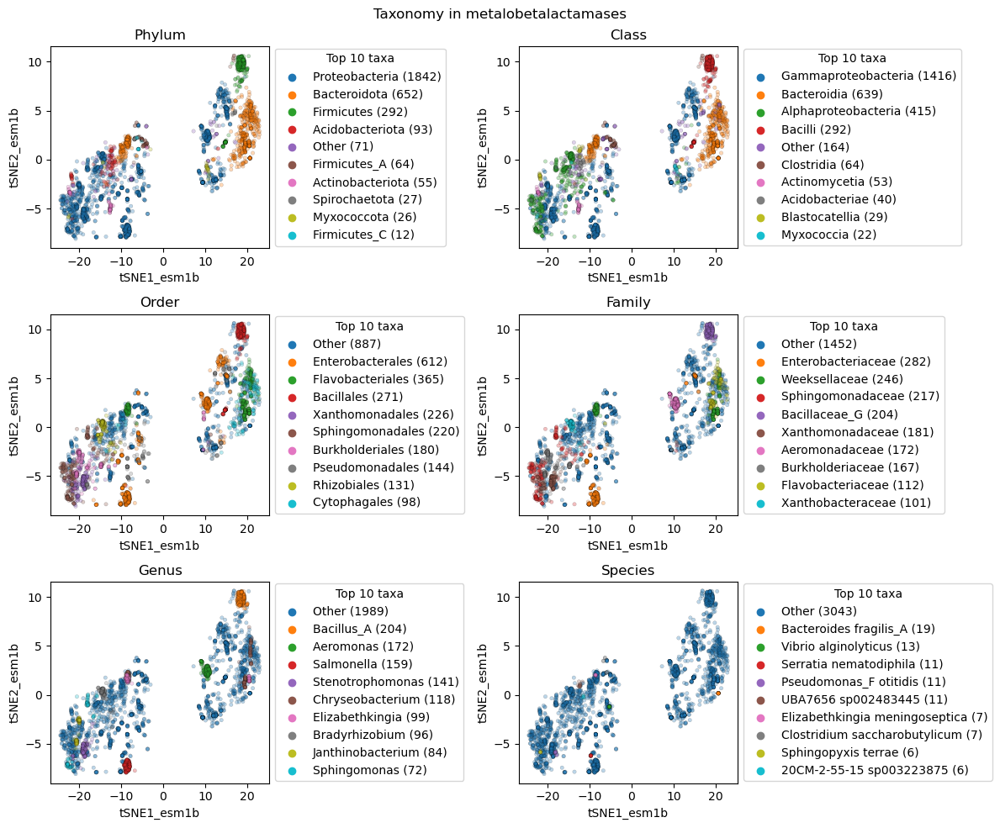

In [22]:
# data source
df = df_mbl.copy()

# taxonomic levels to plot
taxa_lst = ['Phylum', 'Class', 'Order', 'Family', 'Genus', 'Species']

# take the top10 mos abundant taxonomic levels
for taxa in taxa_lst:
    top9 = list(df[taxa].value_counts()[:9].index)
    df.loc[~df[taxa].isin(top9), taxa] = "Other"

# set the composition of the figure 
plt.figure(figsize=(12,10))

# per each taxonomic level 
for idx, taxa in enumerate(taxa_lst):
    
    # create a subplot for the current taxonomic level
    ax = plt.subplot(3, 2, idx+1)
    
    # sort the df by abundance of the current taxonomic level
    df_sorted = df.sort_values(by=taxa, key=lambda x: x.map(x.value_counts()), ascending=False)
    
    # scatterplot
    sns.scatterplot(
        data = df_sorted, x="tSNE1_esm1b", y="tSNE2_esm1b", hue=taxa, 
        alpha=0.3, edgecolor = "black", palette="tab10", ax = ax, s = 10)
    
    # set the title
    plt.title(taxa)
    
    # get the legend
    h, l = ax.get_legend_handles_labels()
    
    # get the counts for each taxon and order the labels to match the order of the handles
    counts = df[taxa].value_counts().reindex(l)
    
    # create new labels that include the count for each taxon
    l = [f'{yn} ({c})' for yn,c in counts.iteritems()]
    
    # set the legend with the new labels and title
    ax.legend(h,l, title="Top 10 taxa", loc='center left', bbox_to_anchor=(1, 0.5))
    
    # adjust
    plt.tight_layout()

# set the main title
plt.suptitle("Taxonomy in metalobetalactamases")
plt.tight_layout()
plt.show()

In [23]:
df[df.bla_subclass == "Class B3"].groupby("Phylum").count().sort_values("seq")#*100/1722

,tSNE1_esm1b,tSNE2_esm1b,seq_id,#name,seq,length,filename,protein_name,protein_family,bla_class,...,predicted_signal_peptide,Other_sigpept,SP(Sec/SPI),LIPO(Sec/SPII),TAT(Tat/SPI),TATLIPO(Sec/SPII),PILIN(Sec/SPIII),CS Position,seq_without_sigpept,carp640M_logp
Phylum,,,,,,,,,,,,,,,,,,,,,
Firmicutes,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,0,1,1
Myxococcota,7,7,7,7,7,7,7,7,7,7,...,7,7,7,7,7,7,7,7,7,7
Firmicutes_C,12,12,12,12,12,12,12,12,12,12,...,12,12,12,12,12,12,12,10,12,12
Spirochaetota,14,14,14,14,14,14,14,14,14,14,...,14,14,14,14,14,14,14,12,14,14
Other,45,45,45,45,45,45,45,45,45,45,...,45,45,45,45,45,45,45,36,45,45
Actinobacteriota,55,55,55,55,55,55,55,55,55,55,...,55,55,55,55,55,55,55,50,55,55
Firmicutes_A,58,58,58,58,58,58,58,58,58,58,...,58,58,58,58,58,58,58,4,58,58
Acidobacteriota,91,91,91,91,91,91,91,91,91,91,...,91,91,91,91,91,91,91,75,91,91
Bacteroidota,176,176,176,176,176,176,176,176,176,176,...,176,176,176,176,176,176,176,171,176,176


In [24]:
df[df.bla_subclass.str.contains("Class B2|Class B1")].groupby("Phylum").count().sort_values("seq")*100/1408

,tSNE1_esm1b,tSNE2_esm1b,seq_id,#name,seq,length,filename,protein_name,protein_family,bla_class,...,predicted_signal_peptide,Other_sigpept,SP(Sec/SPI),LIPO(Sec/SPII),TAT(Tat/SPI),TATLIPO(Sec/SPII),PILIN(Sec/SPIII),CS Position,seq_without_sigpept,carp640M_logp
Phylum,,,,,,,,,,,,,,,,,,,,,
Acidobacteriota,0.142045,0.142045,0.142045,0.142045,0.142045,0.142045,0.142045,0.142045,0.142045,0.142045,...,0.142045,0.142045,0.142045,0.142045,0.142045,0.142045,0.142045,0.142045,0.142045,0.142045
Firmicutes_A,0.426136,0.426136,0.426136,0.426136,0.426136,0.426136,0.426136,0.426136,0.426136,0.426136,...,0.426136,0.426136,0.426136,0.426136,0.426136,0.426136,0.426136,0.426136,0.426136,0.426136
Spirochaetota,0.923295,0.923295,0.923295,0.923295,0.923295,0.923295,0.923295,0.923295,0.923295,0.923295,...,0.923295,0.923295,0.923295,0.923295,0.923295,0.923295,0.923295,0.710227,0.923295,0.923295
Myxococcota,1.349432,1.349432,1.349432,1.349432,1.349432,1.349432,1.349432,1.349432,1.349432,1.349432,...,1.349432,1.349432,1.349432,1.349432,1.349432,1.349432,1.349432,1.349432,1.349432,1.349432
Other,1.704545,1.704545,1.704545,1.704545,1.704545,1.704545,1.704545,1.704545,1.704545,1.704545,...,1.704545,1.704545,1.704545,1.704545,1.704545,1.704545,1.704545,1.633523,1.704545,1.704545
Firmicutes,20.667614,20.667614,20.667614,20.667614,20.667614,20.667614,20.667614,20.667614,20.667614,20.667614,...,20.667614,20.667614,20.667614,20.667614,20.667614,20.667614,20.667614,19.815341,20.667614,20.667614
Bacteroidota,33.735795,33.735795,33.735795,33.735795,33.735795,33.735795,33.735795,33.735795,33.735795,33.735795,...,33.735795,33.735795,33.735795,33.735795,33.735795,33.735795,33.735795,33.309659,33.735795,33.735795
Proteobacteria,41.051136,41.051136,41.051136,41.051136,41.051136,41.051136,41.051136,41.051136,41.051136,41.051136,...,41.051136,41.051136,41.051136,41.051136,41.051136,41.051136,41.051136,37.784091,41.051136,41.051136


In [25]:
def do_iscatter(df, annot):
    
    """
    do a scatterplot given a df and hue
    """
   
    custom_palette = px.colors.qualitative.Plotly
    custom_palette[0] = "#edeef2"
    
    # plot
    fig = px.scatter(
    df, x = 'tSNE1_esm1b', y = 'tSNE2_esm1b',
    height = 600, width = 700, color = annot,
    hover_name = annot, opacity=0.6,
    color_discrete_sequence = custom_palette,
    hover_data = ["protein_family_header", '#name', "protein_name"])

    fig.update_traces(marker=dict(size=8, line=dict(width=1,color=None)),selector=dict(mode='markers'))
    fig.update_layout(template="plotly_white")
    #fig.update_xaxes(showgrid=True, gridwidth=0.5, gridcolor='LightGrey',mirror=True)
    #fig.update_yaxes(showgrid=True, gridwidth=0.5, gridcolor='LightGrey', mirror=True)
    fig.update_yaxes(showline=True, linewidth=1, linecolor='LightGrey')
    fig.update_xaxes(showline=True, linewidth=1, linecolor='LightGrey')
    fig.show()

In [26]:
do_iscatter(df_sbl[df_sbl.bla_class == "Class C"], "Genus")

fin